<a href="https://colab.research.google.com/github/diegosdantonio/Book_notes/blob/main/python_examples/Simple_pendulum_damped_term.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

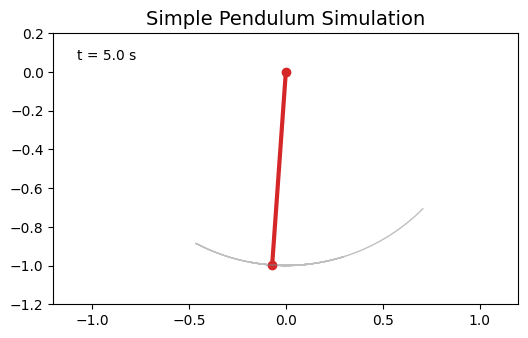

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML # Import HTML for displaying in Colab


# -------------------------------
# Parameters
# -------------------------------
g = 9.81      # gravity (m/s^2)
l = 1.0       # pendulum length (m)
theta0 = np.pi / 4  # initial angle (rad)
omega0 = 0.0        # initial angular velocity (rad/s)
dt = 0.01           # time step (s)
t_max = 5          # total simulation time (s)

# -------------------------------
# Equation of motion:
#    theta_ddot = -(g/l)*sin(theta)
# -------------------------------
def pendulum_dynamics(state, dt):
    theta, omega = state
    theta_dot = omega
    omega_dot = -(g/l) * np.sin(theta) - 1/(l**2) * theta_dot
    theta_new = theta + theta_dot * dt
    omega_new = omega + omega_dot * dt
    return np.array([theta_new, omega_new])

# -------------------------------
# Time integration
# -------------------------------
n_steps = int(t_max / dt)
state = np.zeros((n_steps, 2))
state[0] = [theta0, omega0]

for i in range(1, n_steps):
    state[i] = pendulum_dynamics(state[i-1], dt)

theta = state[:, 0]
time = np.arange(0, t_max, dt)

# -------------------------------
# Compute Cartesian coordinates
# -------------------------------
x = l * np.sin(theta)
y = -l * np.cos(theta)

# -------------------------------
# Visualization setup
# -------------------------------
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-1.2*l, 1.2*l)
ax.set_ylim(-1.2*l, 0.2*l)
ax.set_aspect('equal')
ax.set_title("Simple Pendulum Simulation", fontsize=14)

line, = ax.plot([], [], 'o-', lw=3, color='tab:red')
trace, = ax.plot([], [], '-', lw=1, color='gray', alpha=0.5)
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)

x_trace, y_trace = [], []

# -------------------------------
# Animation function
# -------------------------------
def update(frame):
    thisx = [0, x[frame]]
    thisy = [0, y[frame]]
    line.set_data(thisx, thisy)
    x_trace.append(x[frame])
    y_trace.append(y[frame])
    trace.set_data(x_trace, y_trace)
    time_text.set_text(f't = {frame*dt:.1f} s')
    return line, trace, time_text

ani = FuncAnimation(
    fig, update, frames=n_steps, interval=20, blit=True
)


HTML(ani.to_jshtml())